In [1]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import sklearn.metrics as metrics
%matplotlib inline

In [2]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10.0, 10.0)
matplotlib.rcParams['image.cmap'] = 'gray'

In [3]:
# Initialize all necessary features
# Initialize SVM
def initialize_svm(C=0.01, gamma=0):
  svm = cv2.ml.SVM_create()
  svm.setGamma(gamma)
  svm.setC(C)
  svm.setKernel(cv2.ml.SVM_LINEAR)
  svm.setType(cv2.ml.SVM_C_SVC)
  svm.setTermCriteria((cv2.TERM_CRITERIA_EPS + 
                         cv2.TERM_CRITERIA_MAX_ITER, 
                         1000, 1e-3))

  return svm


# Train SVM on data and labels
def svm_train(svm, samples, labels):
  svm.train(samples, cv2.ml.ROW_SAMPLE, labels)


# predict labels for given samples
def predict(svm, samples):
  return svm.predict(samples)[1]

# Initialize HOG parameters
window = (64, 128)
block = (16, 16)
block_stride = (8, 8)
cell = (8, 8)
n_bins = 9
derivative_aperature = 1
sigma = -1
norm_type = 0
threshold = 0.2
gamma_correction = True
nlevels = 64
gradient = False

# Initialize HOG
hog = cv2.HOGDescriptor(window, block, block_stride,
                      cell, n_bins,derivative_aperature,
                      sigma, norm_type, threshold, 
                      gamma_correction, nlevels,gradient)

In [4]:
# compute HOG features for given images
def get_hog_features(hog, images):
  hog_features = []
  for image in images:
    hog_feature = hog.compute(image)
    hog_features.append(hog_feature)
  return hog_features

# Convert HOG descriptors to format recognized by SVM
def prepare_for_svm(hog_features):
  featureVectorLength = len(hog_features[0])
  print("Feature vector: ", featureVectorLength)
  data = np.float32(hog_features).reshape(-1, featureVectorLength)
  print("Data: ", data.shape)
  return data

def get_svm_detector_for_hog(model_path, hog):
  svm = cv2.ml.SVM_load(model_path)
  sv = svm.getSupportVectors()
  rho,_ ,_ = svm.getDecisionFunction(0)
  svm_detector = np.zeros(sv.shape[1] + 1, dtype=sv.dtype)
  svm_detector[:-1] = -sv[:]
  svm_detector[-1] = rho
  return svm_detector


In [5]:
# Operating with images
def get_image_paths(folder, extension):
  image_paths = []
  for x in os.listdir(folder):
    x_path = os.path.join(folder, x)
    if os.path.splitext(x_path)[1] in extension:
      image_paths.append(x_path)
  return image_paths


def load_data_and_labels(folder, label):
  images = []
  labels = []
  image_paths = get_image_paths(folder, ['.jpg', '.png', '.jpeg'])
  for image_path in image_paths:
    im = cv2.imread(image_path, cv2.IMREAD_COLOR)
    images.append(im)
    labels.append(label)
  return images, labels

# Path to INRIA Person dataset
root ='INRIAPerson/'
# set Train and Test directory paths
train = os.path.join(root, 'train_64x128_H96')  # train: 'INRIAPerson/train_64x128_H96'
test = os.path.join(root, 'test_64x128_H96')  # test: 'INRIAPerson/test_64x128_H96'

In [6]:
# Turn on/off training, testing, querying and retraining activities
is_train = False
is_test = True
is_query = True
is_retrain = False

In [7]:
# Traning for the first time
if is_train:
    train_pos = os.path.join(train, 'posPatches')
    train_neg = os.path.join(train, 'negPatches')

    train_pos_images, train_pos_labels = load_data_and_labels(train_pos, 1)
    train_neg_images, train_neg_labels = load_data_and_labels(train_neg, -1)

    train_images = np.concatenate((np.array(train_pos_images), 
                       np.array(train_neg_images)), 
                                  axis=0)
    train_labels = np.concatenate((np.array(train_pos_labels), 
                       np.array(train_neg_labels)),
                                  axis=0)

    hog_train = get_hog_features(hog, train_images)
    train_data = prepare_for_svm(hog_train)

    # Finally create an SVM object, train the model and save it.
    model = initialize_svm(C=0.01, gamma=0)
    svm_train(model, train_data, train_labels)
    model.save('pedestrian.yml')

Feature vector:  3780
Data:  (1126, 3780)
label -- 1:1065, -1:61
TP: 1065, FP: 61, Total: 1126, error: 5.41740674955595
Feature vector:  3780
Data:  (4530, 3780)
label -- 1:17, -1:4513
TN: 4513, FN: 17, Total: 4530, error: 0.37527593818984545
Precision: 94.58259325044405, Recall: 98.42883548983365


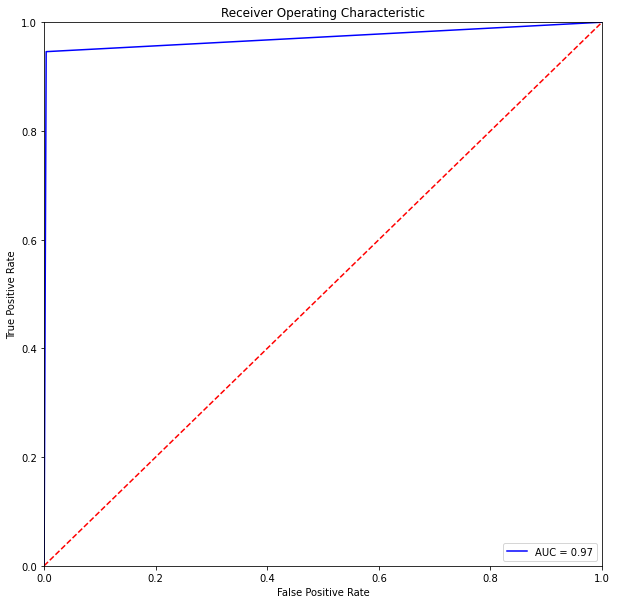

In [8]:
# Testing model with data from test set 
def evaluate(svm, samples, labels):
  labels = labels[:, np.newaxis]
  pred = svm.predict(samples)[1]
  correct = np.sum((labels == pred))
  err = (labels != pred).mean()
  print('label -- 1:{}, -1:{}'.format(np.sum(pred == 1), 
          np.sum(pred == -1)))
  return correct, err * 100, pred

if is_test:
    model = cv2.ml.SVM_load('pedestrian.yml')
    test_pos = os.path.join(test, 'posPatches')
    test_neg = os.path.join(test, 'negPatches')
    # We will follow the same flow to prepare data as we did for training images.
    # Label 1 for positive images and -1 for negative images
    test_pos_images, test_pos_labels = load_data_and_labels(test_pos, 1)
    test_neg_images, test_neg_labels = load_data_and_labels(test_neg, -1)

    # Compute HOG features for images
    hog_post_test = get_hog_features(hog, np.array(test_pos_images))
    test_pos_data = prepare_for_svm(hog_post_test)
    
    pos_correct, pos_err, pos_pred = evaluate(model, test_pos_data, 
                                       np.array(test_pos_labels))

    tp = pos_correct
    fp = len(test_pos_labels) - pos_correct
    print('TP: {}, FP: {}, Total: {}, error: {}'
            .format(tp, fp, len(test_pos_labels), pos_err))

    hog_neg_test = get_hog_features(hog, np.array(test_neg_images))
    test_neg_data = prepare_for_svm(hog_neg_test)
    neg_correct, neg_err, neg_pred = evaluate(model, test_neg_data, 
                                       np.array(test_neg_labels))

    # Calculate True and False Negatives
    tn = neg_correct
    fn = len(test_neg_data) - neg_correct
    print('TN: {}, FN: {}, Total: {}, error: {}'
            .format(tn, fn, len(test_neg_labels), neg_err))
    # Calculate Precision and Recall
    precision = tp * 100 / (tp + fp)
    recall = tp * 100 / (tp + fn)
    print('Precision: {}, Recall: {}'.format(precision, recall))

    pos_pred = [i for sublist in pos_pred.tolist() for i in sublist]
    neg_pred = [i for sublist in neg_pred.tolist() for i in sublist]
    for i in range(len(test_neg_labels)):
        test_pos_labels.append(test_neg_labels[i])
        pos_pred.append(neg_pred[i])
    test_labels = test_pos_labels
    test_pred = pos_pred

    fpr, tpr, threshold = metrics.roc_curve(test_labels, test_pred)
    roc_auc = metrics.auc(fpr, tpr)
    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')


In [9]:
# Initialize HOG once again
window = (64, 128)
block = (16, 16)
block_stride = (8, 8)
cell = (8, 8)
n_bins = 9
derivative_aperature = 1
sigma = -1
norm_type = 0
threshold = 0.2
gamma_correction = True
nlevels = 64
gradient = False

hog = cv2.HOGDescriptor(window, block, block_stride,
                      cell, n_bins,derivative_aperature,
                      sigma, norm_type, threshold, 
                      gamma_correction, nlevels,gradient)
svm_detector = get_svm_detector_for_hog('pedestrian.yml', hog)
hog.setSVMDetector(svm_detector)
# Initialize HOG from lib
hog_lib = cv2.HOGDescriptor(window, block, block_stride,
                      cell, n_bins,derivative_aperature,
                      sigma, norm_type, threshold, 
                      gamma_correction, nlevels,gradient)
svm_detector_default = cv2.HOGDescriptor_getDefaultPeopleDetector()
hog_lib.setSVMDetector(svm_detector_default)

In [10]:
# non maxima suppression (copy from online library but not used yet)
def fast_nms(boxes, sc, overlab_thresh):
    # if there are no boxes, return an empty list
    if len(boxes) == 0:
        return []
    # if the bounding boxes integers, convert them to floats --
    # this is important since we'll be doing a bunch of divisions
    if boxes.dtype.kind == "i":
        boxes = boxes.astype("float")

    # initialize the list of picked indexes
    pick = []

    # grab the coordinates of the bounding boxes
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    scores = sc
    # compute the area of the bounding boxes and sort the bounding
    # boxes by the score of the bounding box
    area = (x2 - x1 + 1) * (y2 - y1 + 1)
    idxs = np.argsort(scores)

    # keep looping while some indexes still remain in the indexes
    # list
    while len(idxs) > 0:
        # grab the last index in the indexes list and add the
        # index value to the list of picked indexes
        last = len(idxs) - 1
        i = idxs[last]
        pick.append(i)

        # find the largest (x, y) coordinates for the start of
        # the bounding box and the smallest (x, y) coordinates
        # for the end of the bounding box
        xx1 = np.maximum(x1[i], x1[idxs[:last]])
        yy1 = np.maximum(y1[i], y1[idxs[:last]])
        xx2 = np.minimum(x2[i], x2[idxs[:last]])
        yy2 = np.minimum(y2[i], y2[idxs[:last]])

        # compute the width and height of the bounding box
        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)

        # compute the ratio of overlap
        overlap = (w * h) / area[idxs[:last]]

        idxs = np.delete(idxs, np.concatenate(([last],
                                               np.where(overlap > overlab_thresh)[0])))

    # return only the bounding boxes that were picked using the
    # integer data type
    return boxes[pick]

processing: /home/hoang/Documents/ComputerVision/Project/Data/4.jpeg
Trained Detector :: pedestrians detected: 4
Default Detector :: pedestrians detected: 1


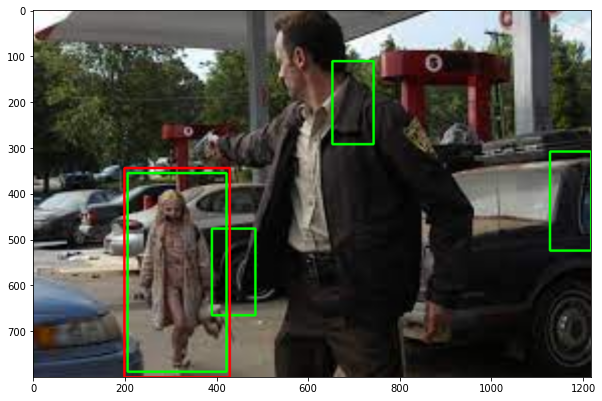

processing: /home/hoang/Documents/ComputerVision/Project/Data/1.jpg
Trained Detector :: pedestrians detected: 4
Default Detector :: pedestrians detected: 6


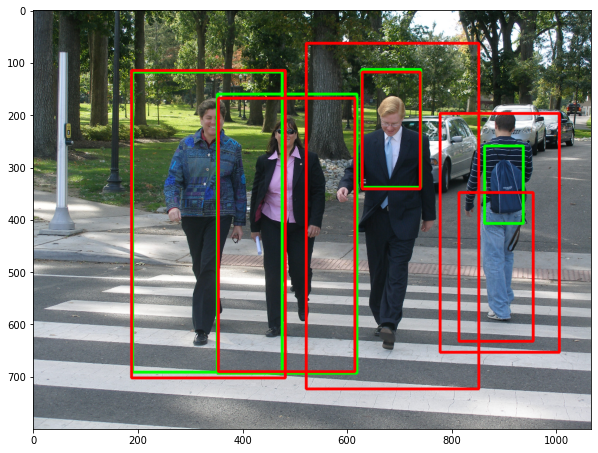

processing: /home/hoang/Documents/ComputerVision/Project/Data/4.png
Trained Detector :: pedestrians detected: 9
Default Detector :: pedestrians detected: 12


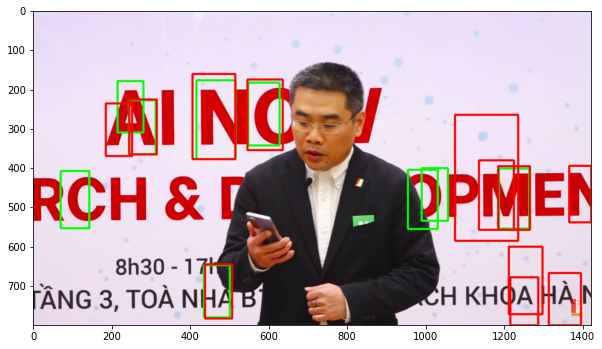

processing: /home/hoang/Documents/ComputerVision/Project/Data/4.jpg
Trained Detector :: pedestrians detected: 3
Default Detector :: pedestrians detected: 3


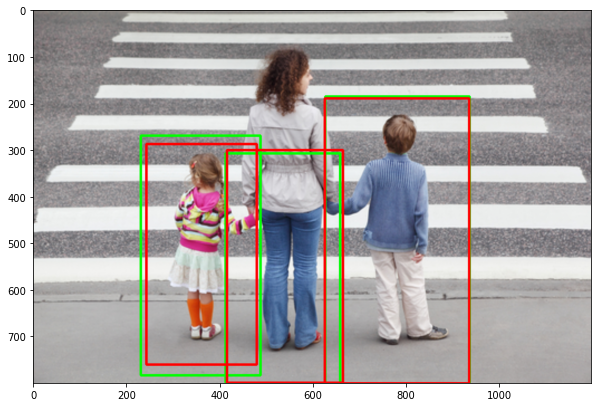

processing: /home/hoang/Documents/ComputerVision/Project/Data/5.jpeg
Trained Detector :: pedestrians detected: 3
Default Detector :: pedestrians detected: 2


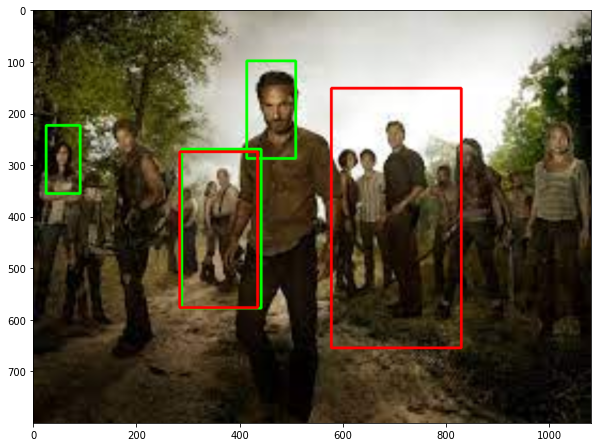

processing: /home/hoang/Documents/ComputerVision/Project/Data/3.jpg
Trained Detector :: pedestrians detected: 2
Default Detector :: pedestrians detected: 2


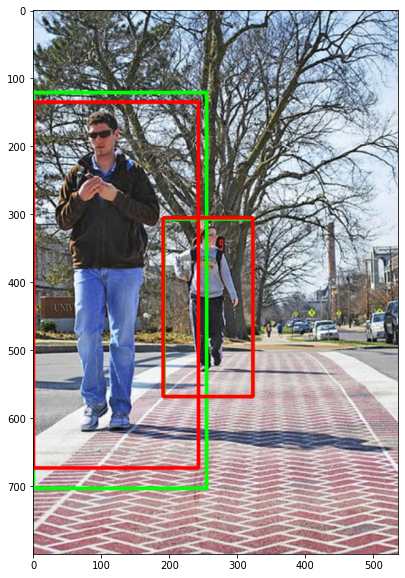

processing: /home/hoang/Documents/ComputerVision/Project/Data/race.jpg
Trained Detector :: pedestrians detected: 9
Default Detector :: pedestrians detected: 10


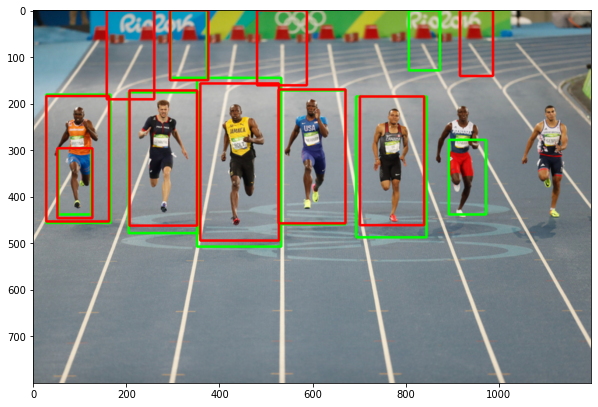

processing: /home/hoang/Documents/ComputerVision/Project/Data/2.png
Trained Detector :: pedestrians detected: 4
Default Detector :: pedestrians detected: 9


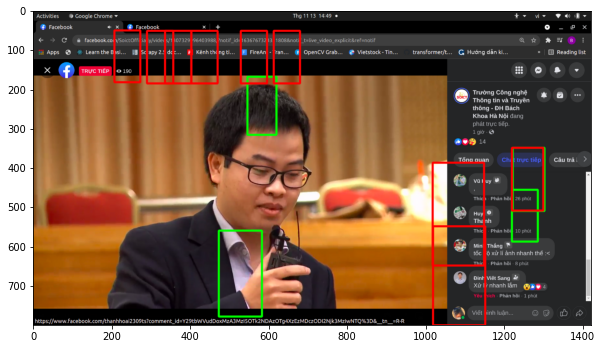

processing: /home/hoang/Documents/ComputerVision/Project/Data/2.jpg
Trained Detector :: pedestrians detected: 3
Default Detector :: pedestrians detected: 3


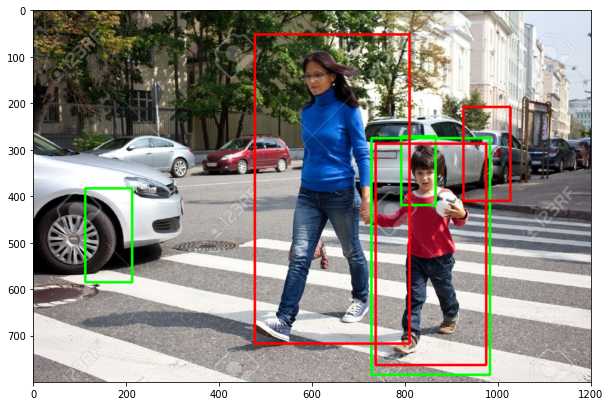

processing: /home/hoang/Documents/ComputerVision/Project/Data/2.jpeg
Trained Detector :: pedestrians detected: 4
Default Detector :: pedestrians detected: 4


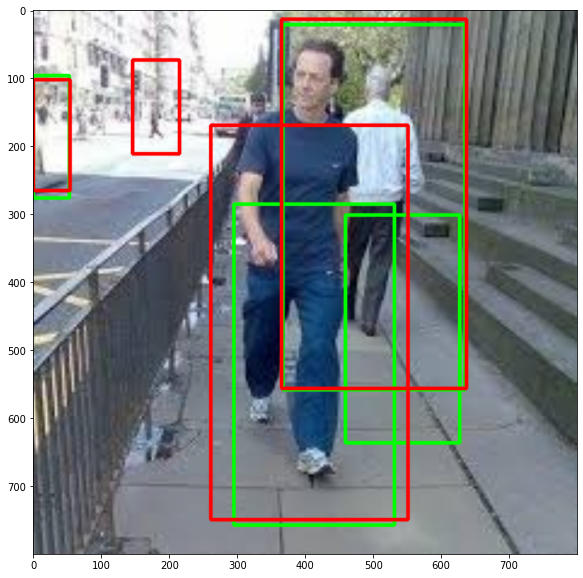

processing: /home/hoang/Documents/ComputerVision/Project/Data/3.jpeg
Trained Detector :: pedestrians detected: 4
Default Detector :: pedestrians detected: 3


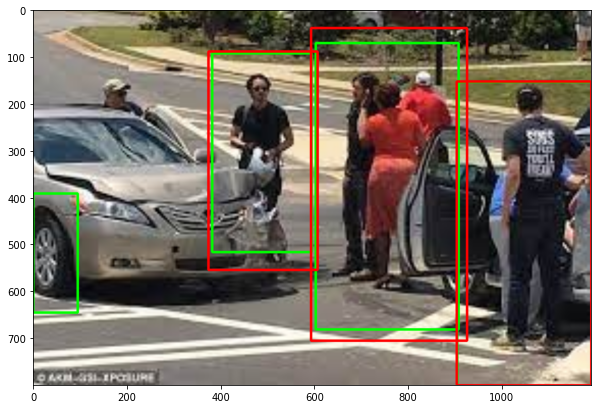

processing: /home/hoang/Documents/ComputerVision/Project/Data/car.jpeg
Trained Detector :: pedestrians detected: 3
Default Detector :: pedestrians detected: 2


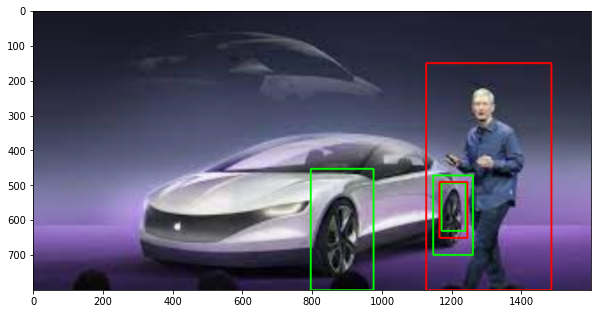

processing: /home/hoang/Documents/ComputerVision/Project/Data/man.png
Trained Detector :: pedestrians detected: 9
Default Detector :: pedestrians detected: 12


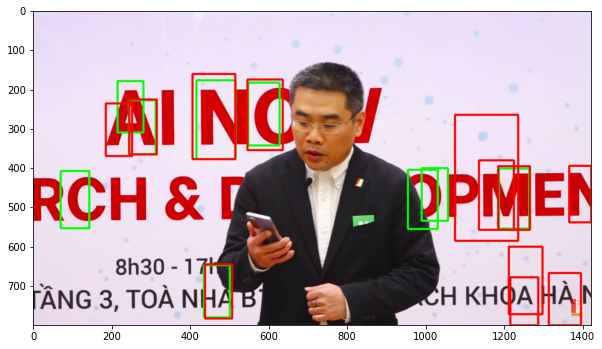

processing: /home/hoang/Documents/ComputerVision/Project/Data/5.jpg
Trained Detector :: pedestrians detected: 4
Default Detector :: pedestrians detected: 4


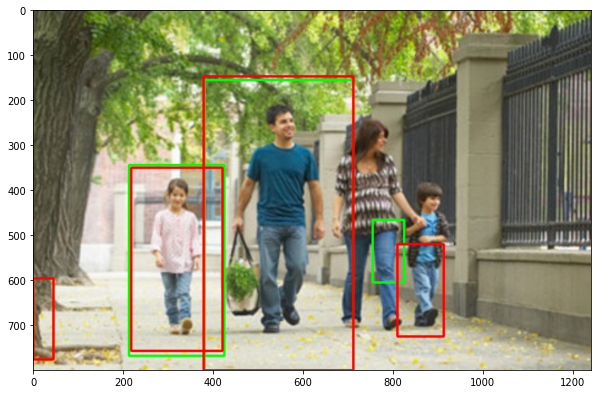

processing: /home/hoang/Documents/ComputerVision/Project/Data/car2.jpeg
Trained Detector :: pedestrians detected: 2
Default Detector :: pedestrians detected: 1


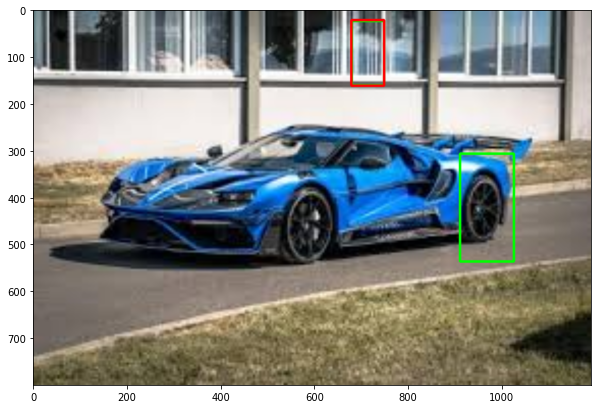

processing: /home/hoang/Documents/ComputerVision/Project/Data/3.png
Trained Detector :: pedestrians detected: 2
Default Detector :: pedestrians detected: 3


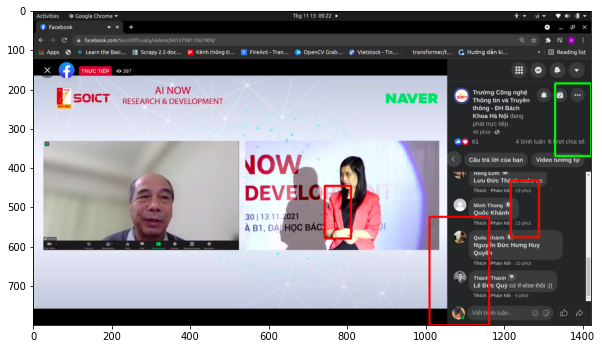

processing: /home/hoang/Documents/ComputerVision/Project/Data/walking_dead_2.jpg
Trained Detector :: pedestrians detected: 5
Default Detector :: pedestrians detected: 4


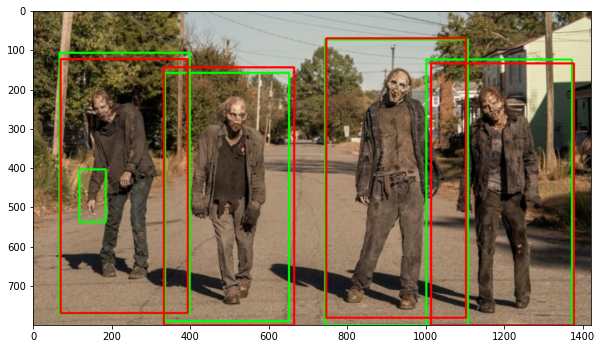

processing: /home/hoang/Documents/ComputerVision/Project/Data/1.jpeg
Trained Detector :: pedestrians detected: 1
Default Detector :: pedestrians detected: 1


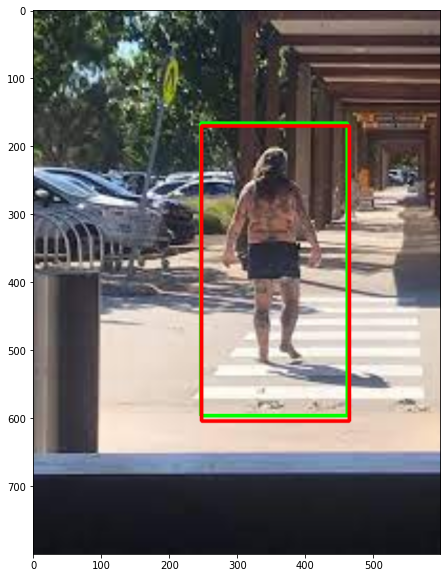

processing: /home/hoang/Documents/ComputerVision/Project/Data/walking_dead_3.jpeg
Trained Detector :: pedestrians detected: 2
Default Detector :: pedestrians detected: 3


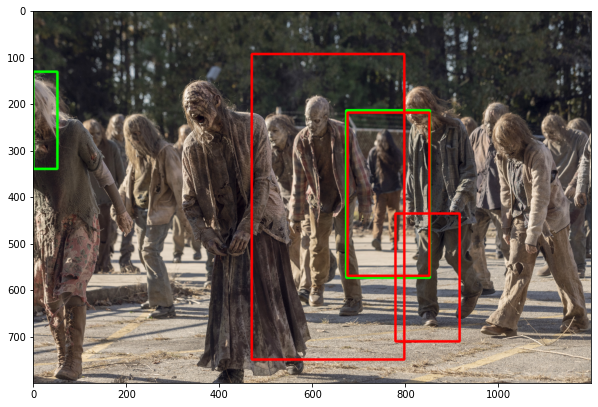

processing: /home/hoang/Documents/ComputerVision/Project/Data/1.png
Trained Detector :: pedestrians detected: 4
Default Detector :: pedestrians detected: 3


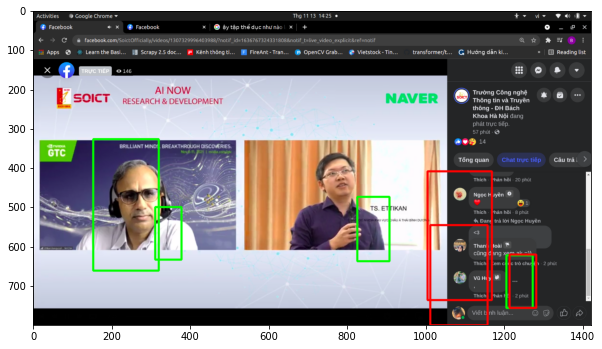

processing: /home/hoang/Documents/ComputerVision/Project/Data/car3.jpeg
Trained Detector :: pedestrians detected: 6
Default Detector :: pedestrians detected: 5


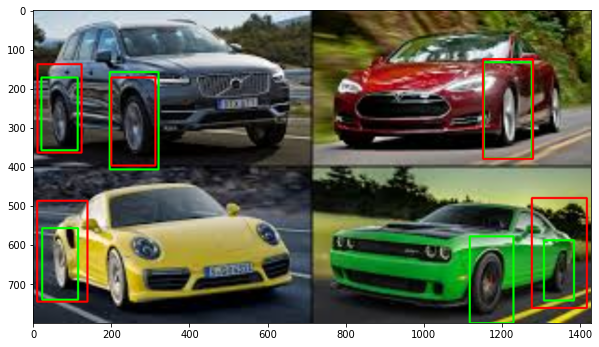

processing: /home/hoang/Documents/ComputerVision/Project/Data/walking_dead_1.jpg


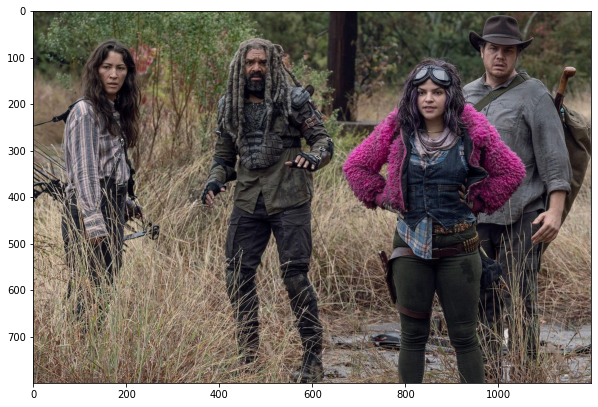

In [11]:
imageDir = 'Data'
# image_paths = glob.glob(os.path.join(imageDir, '*.jpg'))
image_paths = get_image_paths('/home/hoang/Documents/ComputerVision/Project/Data', ['.jpg', '.png', '.jpeg'])
finalHeight = 800.0

for imagePath in image_paths:
    print('processing: {}'.format(imagePath))
    im = cv2.imread(imagePath, cv2.IMREAD_COLOR)
    scale = finalHeight / im.shape[0]
    im = cv2.resize(im, None, fx=scale, fy=scale)
    
    bboxes, weights = hog.detectMultiScale(im, winStride=(8, 8),
                                    padding=(32, 32),scale=1.05, 
                                    finalThreshold=2,hitThreshold=1.0)

    bboxes2, weights2 = hog_lib.detectMultiScale(im, winStride=(8, 8), 
                                padding=(32, 32),scale=1.05, 
                                finalThreshold=2,hitThreshold=0)
    
    if len(bboxes) > 0:
        print('Trained Detector :: pedestrians detected: {}'
                .format(bboxes.shape[0]))
    if len(bboxes2) > 0:
        print('Default Detector :: pedestrians detected: {}'
                .format(bboxes2.shape[0]))

    for bbox in bboxes:
        x1, y1, w, h = bbox
        x2, y2 = x1 + w, y1 + h
        cv2.rectangle(im, (x1, y1), (x2, y2), 
                      (0, 255, 0), thickness=3, 
                      lineType=cv2.LINE_AA)

    for bbox in bboxes2:
        x1, y1, w, h = bbox
        x2, y2 = x1 + w, y1 + h
        cv2.rectangle(im, (x1, y1), (x2, y2), 
                      (0, 0, 255), thickness=3, 
                      lineType=cv2.LINE_AA)
                      
    plt.imshow(im[:,:,::-1])
    # Write image to disk
    # imResultPath = os.path.join('results', os.path.basename(imagePath))
    # cv2.imwrite(imResultPath, im)
    plt.show()

In [12]:
def getHardExamples(negImageList, hog_descriptor):
    hardNegList = []
    hog_descriptor.setSVMDetector(get_svm_detector_for_hog('pedestrian.yml', hog_descriptor))

    for i in range(len(negImageList)):
        bboxes_hard, _ = hog.detectMultiScale(negImageList[i], winStride=(8, 8),
                                    padding=(32, 32),scale=1.05, 
                                    finalThreshold=2,hitThreshold=1.0)
        for (x,y,w,h) in bboxes_hard:
            hardExample = negImageList[i][y:y+h, x:x+w]
            hardNegList.append(cv2.resize(hardExample,(64,128)))

    return hardNegList

In [13]:
window = (64, 128)
block = (16, 16)
block_stride = (8, 8)
cell = (8, 8)
n_bins = 9
derivative_aperature = 1
sigma = -1
norm_type = 0
threshold = 0.2
gamma_correction = True
nlevels = 64
gradient = False

hog_retrain = cv2.HOGDescriptor(window, block, block_stride,
                        cell, n_bins, derivative_aperature,
                        sigma, norm_type, threshold,
                        gamma_correction, nlevels, gradient)

In [14]:
train = os.path.join(root, 'train_64x128_H96')
train_pos = os.path.join(train, 'posPatches')
train_neg = os.path.join(train, 'negPatches')
train_pos_images, train_pos_labels = load_data_and_labels(train_pos, 1)
train_neg_images, train_neg_labels = load_data_and_labels(train_neg, -1)
train_images = np.concatenate((np.array(train_pos_images), 
                    np.array(train_neg_images)), 
                                axis=0)
train_labels = np.concatenate((np.array(train_pos_labels), 
                    np.array(train_neg_labels)),
                                axis=0)

In [15]:
if is_retrain:
    print("Start loading images from other source")
    negImages = []
    for i in os.listdir('13_Natural_Scene'):
        images, train_neg_labels = load_data_and_labels(os.path.join('13_Natural_Scene', i), -1)
        for image in images:
            negImages.append(image)
    print("Finish loading, get hard negative images")                      
    hardNegListImages = getHardExamples(negImages, hog_retrain)
    hardNegLabels = [-1 for i in range(len(hardNegListImages))]
    retrain_images = np.concatenate((np.array(train_images), 
                    np.array(hardNegListImages)), 
                                axis=0)
    retrain_labels = np.concatenate((np.array(train_labels), 
                        np.array(hardNegLabels)),
                                    axis=0)
    hog_retrain_features = get_hog_features(hog_retrain, retrain_images)
    retrain_data = prepare_for_svm(hog_retrain_features)
    model = initialize_svm(C=0.01, gamma=0)
    print("Retraining the model")
    svm_train(model, retrain_data, retrain_labels)
    model.save('pedestrian2.yml')

In [16]:
svm_detector = get_svm_detector_for_hog('pedestrian2.yml', hog)
hog.setSVMDetector(svm_detector)

processing: Data/1.jpg
Trained Detector :: pedestrians detected: 3
Default Detector :: pedestrians detected: 6


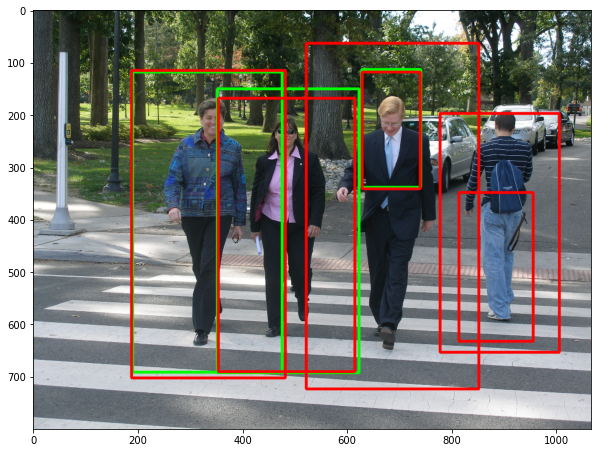

processing: Data/4.jpg
Trained Detector :: pedestrians detected: 2
Default Detector :: pedestrians detected: 3


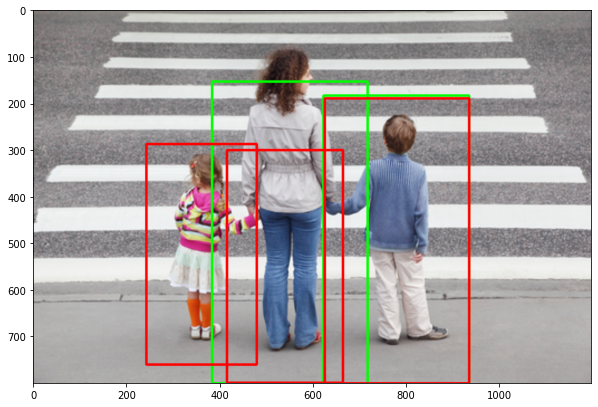

processing: Data/3.jpg
Trained Detector :: pedestrians detected: 2
Default Detector :: pedestrians detected: 2


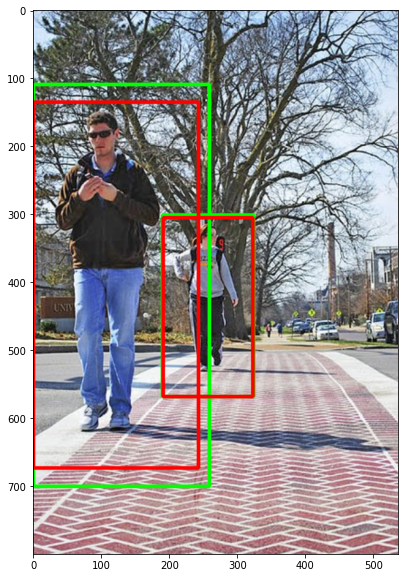

processing: Data/race.jpg
Trained Detector :: pedestrians detected: 8
Default Detector :: pedestrians detected: 10


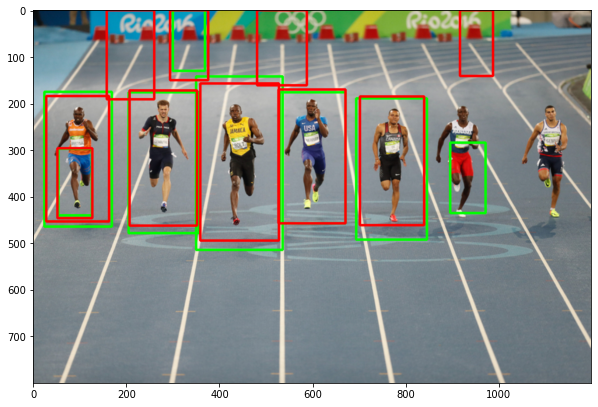

processing: Data/2.jpg
Trained Detector :: pedestrians detected: 1
Default Detector :: pedestrians detected: 3


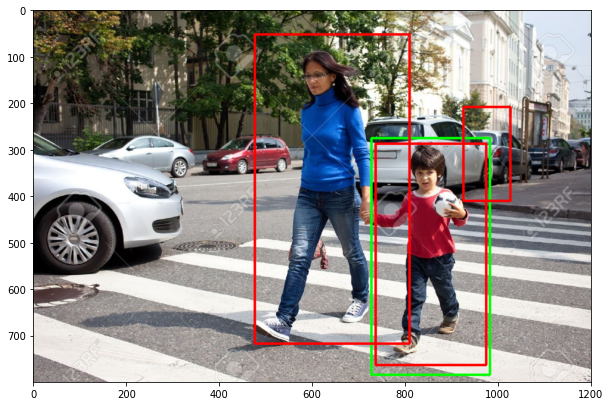

processing: Data/5.jpg
Trained Detector :: pedestrians detected: 3
Default Detector :: pedestrians detected: 4


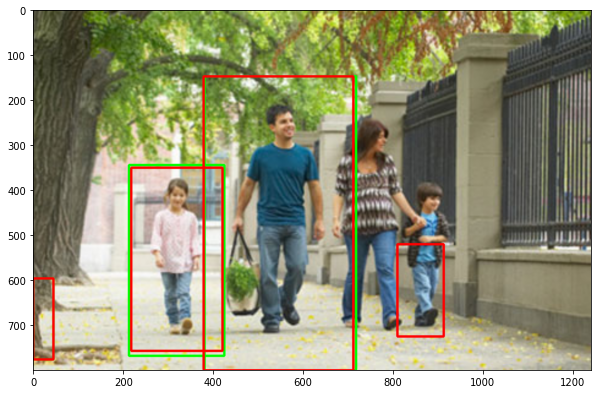

processing: Data/walking_dead_2.jpg
Trained Detector :: pedestrians detected: 5
Default Detector :: pedestrians detected: 4


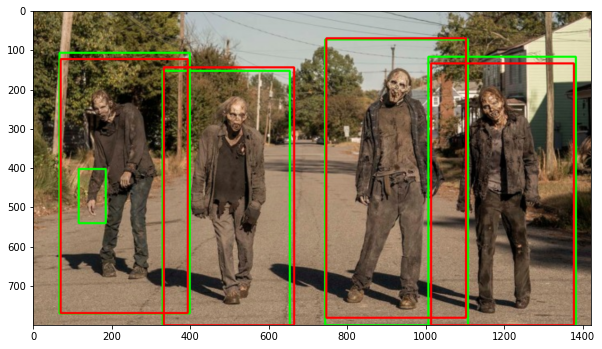

processing: Data/walking_dead_1.jpg


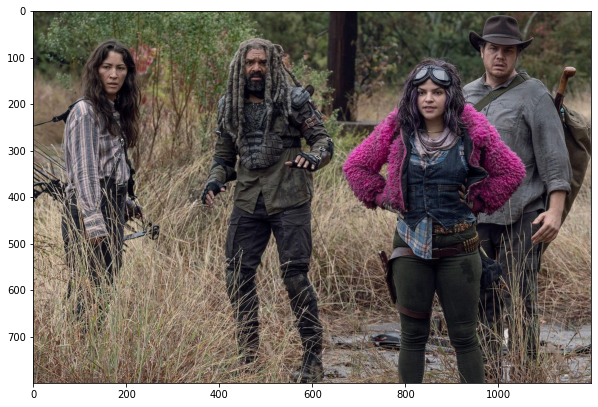

In [17]:
# read images from pedestrians directory
imageDir = 'Data'
image_paths = glob.glob(os.path.join(imageDir, '*.jpg'))
finalHeight = 800.0

for imagePath in image_paths:
    print('processing: {}'.format(imagePath))
    im = cv2.imread(imagePath, cv2.IMREAD_COLOR)
    scale = finalHeight / im.shape[0]
    im = cv2.resize(im, None, fx=scale, fy=scale)
    
    bboxes, weights = hog.detectMultiScale(im, winStride=(8, 8),
                                    padding=(32, 32),scale=1.05, 
                                    finalThreshold=2,hitThreshold=1.0)

    # detectMultiScale using default detector
    bboxes2, weights2 = hog_lib.detectMultiScale(im, winStride=(8, 8), 
                                padding=(32, 32),scale=1.05, 
                                finalThreshold=2,hitThreshold=0)
    
    if len(bboxes) > 0:
        print('Trained Detector :: pedestrians detected: {}'
                .format(bboxes.shape[0]))
    if len(bboxes2) > 0:
        print('Default Detector :: pedestrians detected: {}'
                .format(bboxes2.shape[0]))

    for bbox in bboxes:
        x1, y1, w, h = bbox
        x2, y2 = x1 + w, y1 + h
        cv2.rectangle(im, (x1, y1), (x2, y2), 
                      (0, 255, 0), thickness=3, 
                      lineType=cv2.LINE_AA)

    for bbox in bboxes2:
        x1, y1, w, h = bbox
        x2, y2 = x1 + w, y1 + h
        cv2.rectangle(im, (x1, y1), (x2, y2), 
                      (0, 0, 255), thickness=3, 
                      lineType=cv2.LINE_AA)

    plt.imshow(im[:,:,::-1])
    # Write image to disk
    # imResultPath = os.path.join('results', os.path.basename(imagePath))
    # cv2.imwrite(imResultPath, im)
    plt.show()